# Neighborhood Analysis of Dessert Venues in SF South Bay Area

Borirak Opasanont  
April 8, 2020  

## Introduction

This project explores clustering of dessert venue categories in the neighborhoods of SF South Bay Area. Zip code is used as neighborhood proxy. Then, each cluster of neighborhoods are studied against the demographics with the aim to correlate or explain the becoming of each cluster.

This work is for fulfillment of IBM Data Science Specialization Capstone course on Coursera. This notebook should be available on [my Github page](https://github.com/boriopas/ds-capstone-project) along with its accompanying report and presentation. It is best interpreted with all 3 components of this work.

## Table of Contents

- [Datasets](#Datasets)  
  - [Zip Code Data](#Zip-Code-Data)
  - [Foursquare Data](#Foursquare-Data)
- [Cleaning Data](#Cleaning-Data)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Clustering](#Clustering)
  - [Elbow Method](#Elbow-Method)
  - [Running K-Means](#Running-K-Means)
  - [Analyzing Each Cluster](#Analyzing-Each-Cluster)
- [Demographic Data](#Demographic-Data)
  - [Data Cleaning](#Data-Cleaning)
  - [Decision Tree](#Decision-Tree)
- [Discussion and Conclusion](#Discussion-and-Conclusion)
- [Backup Calculations](#Backup-Calculations)

## Datasets

First, import libaries that we will need.

In [5]:
# The basics
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Needed for Foursquare API calls
import requests
import json # library to handle JSON files
from pandas.io.json import json_normalize

# Needed for visualization
import folium
import matplotlib.pyplot as plt
import matplotlib.cm as cm   # Matplotlib and associated plotting modules
import matplotlib.colors as colors

print('Libraries imported.')

Libraries imported.


### Zip Code Data
We form the list of zip codes of interest. We start by obtaining a list of zip codes and corresponding geo coordinates. I __download this dataset for California__ from an open source platform: https://public.opendatasoft.com/explore/dataset/us-zip-code-latitude-and-longitude/export/?refine.state=CA

In [6]:
zips_all = pd.read_csv('us-zip-code-latitude-and-longitude.csv', sep=';')
zips_all.head()

,Zip,City,State,Latitude,Longitude,Timezone,Daylight savings time flag,geopoint
0,92232,Calexico,CA,33.026203,-115.284581,-8,1,"33.026203,-115.284581"
1,93227,Goshen,CA,36.357151,-119.425371,-8,1,"36.357151,-119.425371"
2,93234,Huron,CA,36.209815,-120.084700,-8,1,"36.209815,-120.0847"
3,93529,June Lake,CA,37.765218,-119.077690,-8,1,"37.765218,-119.07769"
4,93761,Fresno,CA,36.746375,-119.639658,-8,1,"36.746375,-119.639658"


We are only interested in __select zip codes__, namely all of Mountain View, Sunnyvale, Santa Clara, Cupertino, Los Gatos, Los Altos, Los Altos Hills, Campbell, Milpitas, and San Jose except those that are too far south-east, namely, 95135, 95138, 95119, 95139, 95120. Note: 95046 (San Martin), 95037 (Morgan Hill), 95020 (Gilroy) are not in San Jose.

The easiest way to do this is to __form a list externally and import as a csv__ to use as a filter. Note there are __45 zip codes__ of interest.

In [7]:
zips_of_interest = pd.read_csv('zips-of-interest.csv')
zips_of_interest['Zip'] = zips_of_interest['Zip'].astype('str') 
# zips should be string as we're not doing math on it
zips_of_interest['Yes'] = 1 # need this to filter the choropleth later

# filter rows
zips = zips_all[zips_all['Zip'].isin(zips_of_interest['Zip'].tolist())]

# filter columns
zips = zips[['Zip', 'City', 'Latitude', 'Longitude']]
zips['Zip'] = zips['Zip'].astype('str') 
# zips should be string as we're not doing math on it

zips.reset_index(drop=True, inplace=True)
print(zips.shape)
zips.head()

(45, 4)


,Zip,City,Latitude,Longitude
0,94089,Sunnyvale,37.406289,-122.00838
1,95134,San Jose,37.412539,-121.94461
2,95070,Saratoga,37.270543,-122.02305
3,94305,Stanford,37.427039,-122.16496
4,95123,San Jose,37.244426,-121.83246


Before we dive into details, let's first __visualize the San Francisco South Bay Area__ on a map, with the different zip codes "neighborhoods".

The SF South Bay Area falls under the Santa Clara County, who provides zipcode geojson file along with many other interesting data such as demographic and economic data. I downloaded the __GeoJSON file__ for map visualization as well as the csv version for data analysis.

https://data-sccphd.opendata.arcgis.com/datasets/demographic-statistics-zip-code

In [8]:
# Will need these map settings
map_lat = 37.3308156
map_lng = -121.98
scc_geo = r'Demographic_Statistics__Zip_Code.geojson' # geojson file
zoom_start = 11
map_width = 700
map_height = 500

# venue search grid parameters
north_max = 37.503496
south_max = 37.195027
east_max = -121.698897
west_max = -122.203748

In [9]:
# Visualize the South Bay Area with a choropleth

v_map = folium.Map(location=[map_lat, map_lng], zoom_start=10, \
                   width=map_width, height=map_height)

# use choropleth to show zips of interest
v_map.choropleth(
    geo_data=scc_geo,
    data=zips_of_interest,
    columns=['Zip', 'Yes'],
    key_on='feature.properties.zip_code',
    fill_color='YlGn', 
    fill_opacity=0.3, 
    line_opacity=0.5,
    line_weight=2,
    legend_name='SF South Bay Area'
)

# draw bounding box of area to search for venues
folium.features.RectangleMarker(
    bounds=[[north_max,east_max],[south_max,west_max]],
    color='red',
    weight=3,
    fill_opacity=0.0
).add_to(v_map)

# display map
v_map

We will __get venues data within the red bounding box__ above. The bounding box cuts off parts of the neighborhood of interest in the south and east. But those areas are mountainous areas with little to no dessert venues.

### Foursquare Data

Let's now get data on dessert venues from Foursquare. My credentials below will be reset once this assignment is submitted. For info on how to use the search API, see: https://developer.foursquare.com/docs/api-reference/venues/search/

In [10]:
# Set up Foursquare credentials

CLIENT_ID = 'LS4OQQDGLI4KP05PJTAGL0TPBCP3J0K0Q0AQMAOS0WM42332' 
CLIENT_SECRET = 'HAR5GPNWHG2DW5YOPU5IYNAHXLZV3FADS3APPDT45T133HN0' # reset after submission
VERSION = '20200406'
credentials = 'client_id=' + CLIENT_ID + '&client_secret=' + CLIENT_SECRET + '&v=' + VERSION
#print(credentials)

LIMIT = 50   # Foursquare limits result to 30 items anyway

The search API allows __searching in a rectangle area by specifying NE and SW corners__. However, my free personal account has a __limit of 30 on the number of search results per call__. Obviously there are more than 30 dessert places in the whole of South Bay. Therefore to get as many results as we need, we will have to __divide our search area into many grids and loop through them__. After some experimentation, I find that dividing the search area into 20 by 20 grid can fetch most venues. We don't want to go too fine as it will take time and consume the call quota.

In [11]:
# Function to create a grid of latitude and longitude 
# for looping in search API call

def create_ne_sw_lists(ns_size, ew_size, n_max, e_max, s_max, w_max):
    # set number of grids and form grids
    ns_size = ns_size
    ew_size = ew_size
    ns_list = np.linspace(n_max, s_max, ns_size)
    ew_list = np.linspace(e_max, w_max, ew_size)

    # form a list to store NE and SW corners for the API call
    ne_list = []
    sw_list = []
    for i in range(0,ns_size-1):
        for j in range(0,ew_size-1):
            ne_list.append(str(ns_list[i])   + ',' + str(ew_list[j]))
            sw_list.append(str(ns_list[i+1]) + ',' + str(ew_list[j+1]))
    
    return ne_list, sw_list

In [12]:
# Create 20 by 20 grid
ne_list, sw_list = create_ne_sw_lists(21, 21, north_max, east_max, south_max, west_max)

We should also __specify the category type__ in our API call so that it only returns the shops that we are interested in. Looking through Foursquare's [category documentation](https://developer.foursquare.com/docs/build-with-foursquare/categories/), I find the list below to be of interest. Surely there will be some overlap in our results which we will remove the duplicates later on.

In [13]:
# url parameters

intent = 'browse'

category_list = ['4bf58dd8d48988d16a941735', #Bakery
                '4bf58dd8d48988d1e0931735', #Coffee Shop one exceeded 37.3492615,-121.87559485 37.333838050000004,-121.9008374
                '4bf58dd8d48988d1d0941735', #Dessert Shop all good for 21 x 21
                '52e81612bcbc57f1066b7a0c', # Bubble Tea Shop should be ok
                '4bf58dd8d48988d179941735', #Bagel Shop
                '4bf58dd8d48988d16d941735', #Café
                '4bf58dd8d48988d148941735', #Donut Shop
                '4bf58dd8d48988d1dc931735'  #Tea Room
             ]

Now we __loop through all category IDs__, and through __all the grids__. With 8 categories and 400 grids, we will be using 3,200 calls, which is well within the quota of 99,500 calls/day. There may be some grid that the result exceeds limit and only returns 30. Therefore we __printout any grid at which category that has exceeded the limit__. Later on, we can run a finer grid within that grid to get all results.

In [14]:
# Function to call the search API based on a given category list and NE, SW list

def get_venues(credentials, ne_list, sw_list, intent, category_list):

    results_all = pd.DataFrame()   # combine data from all grids here

    for categoryId in category_list:
        for ne, sw in zip(ne_list, sw_list):
            url = 'https://api.foursquare.com/v2/venues/search?{}&ne={}&sw={}&intent={}&categoryId={}' \
                  .format(credentials, ne, sw, intent, categoryId)

            try:        
                results = requests.get(url).json()
                results2 = results['response']['venues']   # assign relevant part of JSON to venues
                results_df = json_normalize(results2)   # tranform venues into a dataframe

                #print this if limit is hit
                if results_df.shape[0] > 29:
                    print('Limit exceeded. Category: ', categoryId, ne, sw, results_df.shape[0])

                results_all = results_all.append(results_df, sort=False)

            except:
                print(results)   # spit out the response to see what was the error message

    return results_all # a pd dataframe

In [473]:
# Now loop through the grid to fetch all shops for all categories

shops_raw = get_venues(credentials, ne_list, sw_list, intent, category_list)

print(shops_raw.shape)
shops_raw.head()

Limit exceeded. Category:  4bf58dd8d48988d1e0931735 37.3492615,-121.87559485 37.333838050000004,-121.9008374 30
(2861, 24)


,id,name,categories,referralId,hasPerk,location.lat,location.lng,location.labeledLatLngs,location.cc,location.city,location.state,location.country,location.formattedAddress,location.address,location.postalCode,location.crossStreet,venuePage.id,location.neighborhood,delivery.id,delivery.url,delivery.provider.name,delivery.provider.icon.prefix,delivery.provider.icon.sizes,delivery.provider.icon.name
0,54cd6c94498e0db58a66f52b,Tous Les Jours,"[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.489026,-121.929387,"[{'label': 'display', 'lat': 37.48902639066435...",US,Fremont,CA,United States,"[Fremont, CA, United States]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,527f0187498e4f765ccdeb74,"La More cafe, Inc.","[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.492503,-121.930102,"[{'label': 'display', 'lat': 37.49250338177205...",US,Fremont,CA,United States,"[46292 Warm Springs Blvd, Fremont, CA 94539, U...",46292 Warm Springs Blvd,94539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4c9fb0262fb1a1432e1ef640,Sogo Bakery,"[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.493435,-121.930059,"[{'label': 'display', 'lat': 37.49343480992922...",US,Fremont,CA,United States,"[46196 Warm Springs Blvd, Fremont, CA 94539, U...",46196 Warm Springs Blvd,94539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4e9ca981b803b7506d57ceb2,Baker's Goods,"[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.501542,-121.929292,"[{'label': 'display', 'lat': 37.50154240710181...",US,NaN,California,United States,"[California, United States]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5934469293bd6364b4f23b41,Sheng Kee Bakery,"[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.493475,-121.930135,"[{'label': 'display', 'lat': 37.493475, 'lng':...",US,Fremont,CA,United States,"[46196 Warm Springs Blvd, Fremont, CA 94539, U...",46196 Warm Springs Blvd,94539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


That took almost 20 mins, returning 2861 rows of data.

We also note that __one attempt has exceeded the call limit__, so let's __run the API call again with finer grid in that specific area__. Then add to the data.

In [477]:
# Use the coord from the exceeded grid and further subdivide into 2x2
ne_list, sw_list = create_ne_sw_lists(3, 3, \
                   37.3492615, -121.87559485, 37.333838050000004, -121.9008374)

categoryId = ['4bf58dd8d48988d1e0931735']  # the category that got exceeded

shops_extra = get_venues(credentials, ne_list, sw_list, intent, categoryId)

# print the actual number of shops that exceeded 30, and add them to the main table
print(shops_extra.shape)
shops_raw = shops_raw.append(shops_extra, sort=False)
shops_raw.shape

(37, 24)


(2898, 24)

So within that original grid there were 37 shops, meaning we've got 7 new shops into the list, together with 30 duplicates.

Since this data set is very costly in terms of time and API call usage, let's __backup this dataframe__ as csv.

In [479]:
### Backup, just in case
# shops_raw.to_csv(path_or_buf='shops_raw.csv', index=False) 

In [59]:
### Uncomment if need to read csv file instead of running API call.
# from ast import literal_eval
# shops_raw = pd.read_csv('shops_raw.csv')

# # need this col to be a list for later data cleaning
# shops_raw['categories'] = shops_raw['categories'].apply(lambda x : list(literal_eval(x))) 

# shops_raw.head()

,id,name,categories,referralId,hasPerk,location.lat,location.lng,location.labeledLatLngs,location.cc,location.city,location.state,location.country,location.formattedAddress,location.address,location.postalCode,location.crossStreet,venuePage.id,location.neighborhood,delivery.id,delivery.url,delivery.provider.name,delivery.provider.icon.prefix,delivery.provider.icon.sizes,delivery.provider.icon.name
0,54cd6c94498e0db58a66f52b,Tous Les Jours,"[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.489026,-121.929387,"[{'label': 'display', 'lat': 37.48902639066435...",US,Fremont,CA,United States,"['Fremont, CA', 'United States']",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,527f0187498e4f765ccdeb74,"La More cafe, Inc.","[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.492503,-121.930102,"[{'label': 'display', 'lat': 37.49250338177205...",US,Fremont,CA,United States,"['46292 Warm Springs Blvd', 'Fremont, CA 94539...",46292 Warm Springs Blvd,94539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4c9fb0262fb1a1432e1ef640,Sogo Bakery,"[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.493435,-121.930059,"[{'label': 'display', 'lat': 37.49343480992922...",US,Fremont,CA,United States,"['46196 Warm Springs Blvd', 'Fremont, CA 94539...",46196 Warm Springs Blvd,94539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4e9ca981b803b7506d57ceb2,Baker's Goods,"[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.501542,-121.929292,"[{'label': 'display', 'lat': 37.50154240710181...",US,NaN,California,United States,"['California', 'United States']",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5934469293bd6364b4f23b41,Sheng Kee Bakery,"[{'id': '4bf58dd8d48988d16a941735', 'name': 'B...",v-1586648265,False,37.493475,-121.930135,"[{'label': 'display', 'lat': 37.493475, 'lng':...",US,Fremont,CA,United States,"['46196 Warm Springs Blvd', 'Fremont, CA 94539...",46196 Warm Springs Blvd,94539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Cleaning Data
Let's __select only the columns of interest__. Besides the id, name, and category, we'd want the zip code, city, and lat-long. Also, let's clean up the category column.

In [60]:
# Copy dataframe in case I need to revert back
shops = pd.DataFrame()
shops = shops_raw

# Filter only columns of interest
filtered_columns = ['id', 'name', 'categories', 'location.city', 
                    'location.postalCode', 'location.lat', 'location.lng']
shops = shops.loc[:, filtered_columns]

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']
    
# filter the category for each row
shops['categories'] = shops.apply(get_category_type, axis=1)

# Pretty column names
shops.rename(columns={'name':'Name', 
                      'categories':'Category', 
                      'location.city':'City', 
                      'location.postalCode':'Zip', 
                      'location.lat':'Latitude',
                      'location.lng':'Longitude'
                     }, inplace=True)

# zips should be string as we're not doing math on it
shops['Zip'] = shops['Zip'].astype('str') 

print(shops.shape)
shops.head()

(2898, 7)


,id,Name,Category,City,Zip,Latitude,Longitude
0,54cd6c94498e0db58a66f52b,Tous Les Jours,Bakery,Fremont,nan,37.489026,-121.929387
1,527f0187498e4f765ccdeb74,"La More cafe, Inc.",Bakery,Fremont,94539,37.492503,-121.930102
2,4c9fb0262fb1a1432e1ef640,Sogo Bakery,Bakery,Fremont,94539,37.493435,-121.930059
3,4e9ca981b803b7506d57ceb2,Baker's Goods,Bakery,NaN,nan,37.501542,-121.929292
4,5934469293bd6364b4f23b41,Sheng Kee Bakery,Bakery,Fremont,94539,37.493475,-121.930135


Now, let's remove data whose zip code is beyond the scope here by only selecting those in our zip code list.

In [61]:
shops = shops[shops['Zip'].isin(zips['Zip'])]
print(shops.shape)
shops.head()

(2304, 7)


,id,Name,Category,City,Zip,Latitude,Longitude
16,4b747278f964a5203add2de3,Sheng Kee Bakery,Bakery,Milpitas,95035,37.456933,-121.910688
17,5da3dcdf7595dd00073abd08,Mian Bao House,Bakery,Milpitas,95035,37.455523,-121.909897
18,4dfc3dea185009bba4de6f60,Kee Wah Bakery,Bakery,Milpitas,95035,37.455325,-121.910074
19,55d8f443498edc33c2cfcfc9,The Original Luisa & Son Bakeshop,Bakery,Milpitas,95035,37.457154,-121.910851
20,55da90d0498e11b2e967d51b,California Bakehouse,Bakery,Milpitas,95035,37.455293,-121.910073


The number of rows reduced from 2898 to 2304.

Next we work on the rows by removing duplicates and missing values.

In [62]:
# Remove duplicate rows, if any
shops.drop_duplicates(subset="id", keep=False, inplace=True) 
print('After removing duplicates: ', shops.shape)
shops.dropna(axis=0, how='any', inplace=True)
print('After removing NA: ', shops.shape)

shops.reset_index(drop=True, inplace=True)
shops.head()

After removing duplicates:  (1651, 7)
After removing NA:  (1651, 7)


,id,Name,Category,City,Zip,Latitude,Longitude
0,4b747278f964a5203add2de3,Sheng Kee Bakery,Bakery,Milpitas,95035,37.456933,-121.910688
1,5da3dcdf7595dd00073abd08,Mian Bao House,Bakery,Milpitas,95035,37.455523,-121.909897
2,4dfc3dea185009bba4de6f60,Kee Wah Bakery,Bakery,Milpitas,95035,37.455325,-121.910074
3,55d8f443498edc33c2cfcfc9,The Original Luisa & Son Bakeshop,Bakery,Milpitas,95035,37.457154,-121.910851
4,55da90d0498e11b2e967d51b,California Bakehouse,Bakery,Milpitas,95035,37.455293,-121.910073


Great, so we have quite a significant number of 1651 rows of data.

In [63]:
### Backup, just in case
# shops.to_csv(path_or_buf='shops.csv', index=False) 

In [64]:
### Uncomment if need to read csv file instead of running API call.
# shops = pd.read_csv('shops.csv')

# # zips should be string as we're not doing math on it
# shops['Zip'] = shops['Zip'].astype('str') 

# print(shops.shape)
# shops.head()

## Exploratory Data Analysis

Let's see how many zip codes our venues data contains after filtering top only those of interest.

Total number of Zip Code is:  44


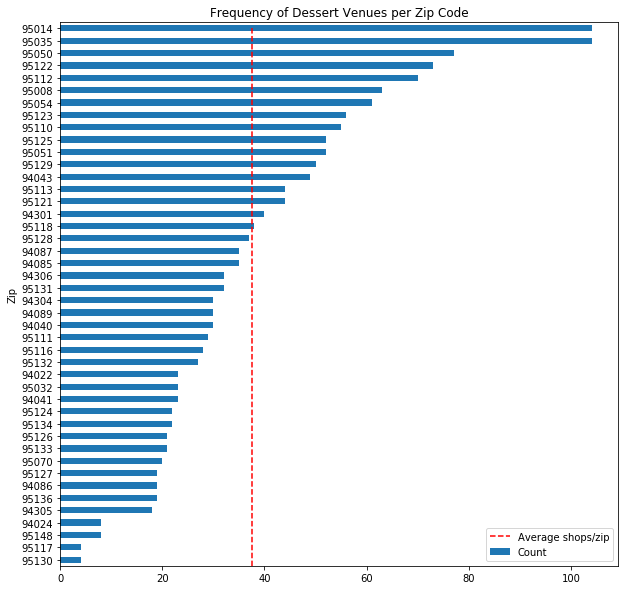

In [194]:
zips_in_shops = shops[['Zip','id']].groupby('Zip').count()
zips_in_shops.reset_index(inplace=True)
zips_in_shops.rename(columns={'id' : 'Count'}, inplace=True)
zips_in_shops.sort_values('Count', ascending=False, inplace=True)
total_zips = zips_in_shops.shape[0]
print('Total number of Zip Code is: ', total_zips)
total_shops = shops.shape[0]

# Plot bar chart of dessert venue categories with at least 2 counts
zips_in_shops.plot(kind='barh', x='Zip', y='Count', 
                           figsize=(10,10))
plt.gca().invert_yaxis()

# add average number of shops per zip
plt.plot([total_shops/total_zips, total_shops/total_zips],[0,total_zips],'--',color='red', label='Average shops/zip')

plt.title('Frequency of Dessert Venues per Zip Code')
plt.legend()

Note that we have 44 zip codes with dessert venues, meaning 1 less than our zip of interest list. The poor zip code without a dessert place is...

In [66]:
zips[~zips['Zip'].isin(zips_in_shops['Zip'])]

,Zip,City,Latitude,Longitude
9,95002,Alviso,37.427439,-121.97521


Understandable. Alviso is a small neighborhood by the tip of the bay with mostly residential area.

Let's look at where these __shops are on the map__.

In [67]:
v_map = folium.Map(location=[map_lat, map_lng], zoom_start=zoom_start, \
                   width=map_width, height=map_height)

# use choropleth to show zips of interest
v_map.choropleth(
    geo_data=scc_geo,
    data=zips_of_interest,
    columns=['Zip', 'Yes'],
    key_on='feature.properties.zip_code',
    fill_color='YlGn', 
    fill_opacity=0.1, 
    line_opacity=0.5,
    line_weight=2,
    legend_name='SF South Bay Area'
)

# add markers of each venue
for lat, lng, label in zip(shops.Latitude, shops.Longitude, shops.Category):
    folium.features.CircleMarker(
        [lat, lng],
        radius=1,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=1.0
    ).add_to(v_map)

#display map
v_map

Pretty easy to get to a dessert place if you're not picky! Also notice how the venues are dotted along major roads and highways.

To see their __frequency by venue category for the whole of South Bay Area__, we group the data by category, and display as a bar chart.

In [68]:
cat = shops[['Category','id']].groupby('Category').count()
cat.reset_index(inplace=True)
cat.rename(columns={'id' : 'Count'}, inplace=True)
cat.sort_values('Count', ascending=False, inplace=True)
print('Total number of category is: ', cat.shape[0])

Total number of category is:  63


Since there are 63 categories, we will only display the ones more common ones. Hence, let's __filter to those with venue count > 1__, resulting in 34 categories displayed.

<function matplotlib.pyplot.legend(*args, **kwargs)>

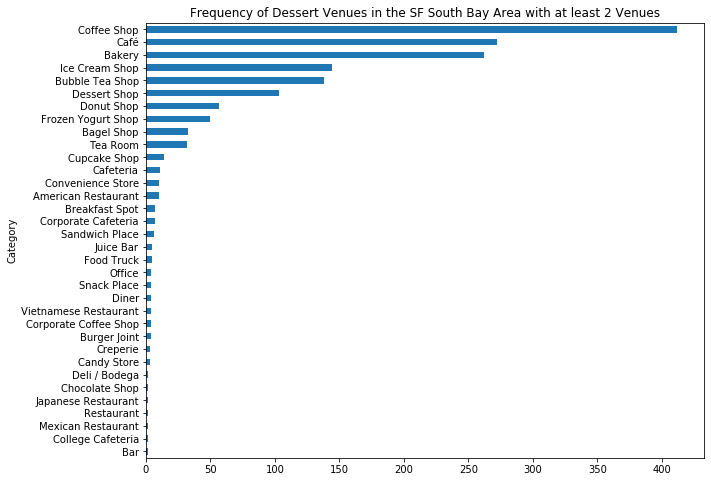

In [69]:
# Plot bar chart of dessert venue categories with at least 2 counts
cat[cat['Count'] > 1].plot(kind='barh', x='Category', y='Count', 
                           figsize=(10,8), legend=None)
plt.gca().invert_yaxis()
plt.title('Frequency of Dessert Venues in the SF South Bay Area with at least 2 Venues')
plt.legend

Coffee shops, cafes and bakeries are the most frequent venues. No surprises there. But there's also ice cream, bubble tea, donut, froyo, bagel and more that are of significant numbers, which can be useful in clustering the neighborhoods.

## Clustering
Our goal is to see __if there's any difference between top 10 in each zip code__. To do so we need to do __one-hot encoding__ on the categories, then group by zip code.

In [201]:
# Perform one-hot encoding
zip_cat = pd.get_dummies(shops['Category'])
zip_cat['Zip'] = shops['Zip']

# move Zip column to the first column
fixed_columns = [zip_cat.columns[-1]] + list(zip_cat.columns[:-1])
zip_cat = zip_cat[fixed_columns]
zip_cat = zip_cat.groupby('Zip').mean().reset_index()
print(zip_cat.shape)
zip_cat.head()

(44, 64)


,Zip,American Restaurant,Bagel Shop,Bakery,Bar,Bowling Alley,Breakfast Spot,Bubble Tea Shop,Burger Joint,Burrito Place,Business Service,Cafeteria,Café,Candy Store,Chinese Restaurant,Chocolate Shop,Coffee Shop,College Cafeteria,Convenience Store,Corporate Cafeteria,Corporate Coffee Shop,Creperie,Cupcake Shop,Dairy Store,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Donut Shop,Emergency Room,Empanada Restaurant,Fast Food Restaurant,Food Court,Food Stand,Food Truck,French Restaurant,Frozen Yogurt Shop,German Restaurant,Greek Restaurant,Grocery Store,Ice Cream Shop,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Juice Bar,Mediterranean Restaurant,Mexican Restaurant,North Indian Restaurant,Office,Other Nightlife,Pastry Shop,Peruvian Restaurant,Pizza Place,Pop-Up Shop,Portuguese Restaurant,Restaurant,Sandwich Place,Shopping Mall,Snack Place,Sporting Goods Shop,Taco Place,Taiwanese Restaurant,Tea Room,Vietnamese Restaurant
0,94022,0.000000,0.043478,0.173913,0.0,0.0,0.086957,0.086957,0.0,0.0,0.0,0.0,0.173913,0.043478,0.0,0.0,0.173913,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.043478,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.043478,0.0,0.000000,0.086957,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.043478,0.000000
1,94024,0.125000,0.125000,0.125000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.125000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.250000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.125000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
2,94040,0.000000,0.100000,0.100000,0.0,0.0,0.000000,0.066667,0.0,0.0,0.0,0.0,0.233333,0.000000,0.0,0.0,0.200000,0.0,0.033333,0.0,0.000000,0.0,0.0,0.0,0.000000,0.033333,0.0,0.000000,0.033333,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.033333,0.000000,0.0,0.033333,0.133333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
3,94041,0.000000,0.000000,0.217391,0.0,0.0,0.000000,0.086957,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.304348,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.130435,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.130435,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.043478,0.086957
4,94043,0.020408,0.040816,0.102041,0.0,0.0,0.020408,0.000000,0.0,0.0,0.0,0.0,0.142857,0.000000,0.0,0.0,0.448980,0.0,0.000000,0.0,0.081633,0.0,0.0,0.0,0.020408,0.020408,0.0,0.020408,0.020408,0.0,0.0,0.0,0.0,0.0,0.020408,0.0,0.000000,0.000000,0.0,0.000000,0.040816,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000


Let's __print out the top 10 venues in each zip code__ to have a quick look. Our goal here is to see at __which level do we cut off__. If our data is limited, we may not have enough to do a top 10. Maybe a top 5 or a top 3 should be considered instead.

In [71]:
num_top_venues = 10

for z in zip_cat['Zip']:
    print("----" + z + "----")
    temp = zip_cat[zip_cat['Zip'] == z].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----94022----
               venue  freq
0        Coffee Shop  0.17
1             Bakery  0.17
2               Café  0.17
3     Breakfast Spot  0.09
4    Bubble Tea Shop  0.09
5     Ice Cream Shop  0.09
6           Tea Room  0.04
7         Bagel Shop  0.04
8  German Restaurant  0.04
9        Candy Store  0.04


----94024----
                 venue  freq
0         Dessert Shop  0.25
1  American Restaurant  0.12
2          Pizza Place  0.12
3           Bagel Shop  0.12
4          Coffee Shop  0.12
5   Frozen Yogurt Shop  0.12
6               Bakery  0.12
7  Sporting Goods Shop  0.00
8   Mexican Restaurant  0.00
9    German Restaurant  0.00


----94040----
                venue  freq
0                Café  0.23
1         Coffee Shop  0.20
2      Ice Cream Shop  0.13
3              Bakery  0.10
4          Bagel Shop  0.10
5     Bubble Tea Shop  0.07
6  Frozen Yogurt Shop  0.03
7       Grocery Store  0.03
8   Convenience Store  0.03
9        Dessert Shop  0.03


----94041----
              

9  American Restaurant  0.00


----95132----
                venue  freq
0     Bubble Tea Shop  0.33
1              Bakery  0.15
2         Coffee Shop  0.15
3                Café  0.15
4          Donut Shop  0.07
5  Frozen Yogurt Shop  0.04
6          Bagel Shop  0.04
7      Ice Cream Shop  0.04
8        Dessert Shop  0.04
9           Juice Bar  0.00


----95133----
                      venue  freq
0               Coffee Shop  0.33
1           Bubble Tea Shop  0.24
2                    Bakery  0.19
3                Donut Shop  0.05
4                  Tea Room  0.05
5                Taco Place  0.05
6               Snack Place  0.05
7                      Café  0.05
8       American Restaurant  0.00
9  Mediterranean Restaurant  0.00


----95134----
                      venue  freq
0               Coffee Shop  0.41
1                      Café  0.36
2                 Cafeteria  0.09
3                    Office  0.05
4                    Bakery  0.05
5                Donut Shop  0.05
6  

Out of 44 zip codes, there are 2 (95117 and 95130) with only top 3 categories, and 11 others that have at least 5 top, but not all 10, categories. Hence it would make more sense to __use top 5 categories in our analysis__.

Put that into a dataframe by first using a __function to sort the top venues__.

In [72]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [73]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Zip']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
zip_cat_sorted = pd.DataFrame(columns=columns)
zip_cat_sorted['Zip'] = zip_cat['Zip']

for ind in np.arange(zip_cat.shape[0]):
    zip_cat_sorted.iloc[ind, 1:] = return_most_common_venues(zip_cat.iloc[ind, :], num_top_venues)

zip_cat_sorted.head()

,Zip,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,94022,Coffee Shop,Bakery,Café,Breakfast Spot,Bubble Tea Shop
1,94024,Dessert Shop,American Restaurant,Frozen Yogurt Shop,Pizza Place,Coffee Shop
2,94040,Café,Coffee Shop,Ice Cream Shop,Bagel Shop,Bakery
3,94041,Coffee Shop,Bakery,Dessert Shop,Ice Cream Shop,Bubble Tea Shop
4,94043,Coffee Shop,Café,Bakery,Corporate Coffee Shop,Bagel Shop


### Elbow Method
Run k-means clustering. We need to __decide the number of clusters using the elbow method__ by trying k within range 1 to 9. We will use __inertia as the metric__ (sum of squared distances of samples to their closest cluster center). For more info, see [sk-learn's documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).

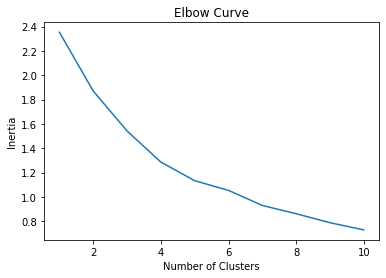

In [80]:
from sklearn.cluster import KMeans

# Form a features set
cat_features = zip_cat.drop('Zip', 1)

k_range = range(1,11)
inertia_range = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, n_init=12).fit(cat_features)  # 12 initiations and take one with best inertia
    inertia_range.append(kmeans.inertia_)
    
# Plot the elbow plot
plt.plot(k_range, inertia_range)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Curve')
plt.show()

I see an __elbow at k=5__, but one could argue otherwise. Ideally, a second derivative plot would be needed to find the point at which maximum rate of change of the slope occurs. But that is beyond the scope here.

### Running K-Means
With k=5, let's run k-means again to generate the cluster labels.

In [81]:
k = 5
kmeans = KMeans(n_clusters=k, n_init=12).fit(cat_features)  # 12 initiations and take one with best inertia
kmeans.labels_[0:10] 

array([1, 1, 1, 1, 2, 4, 2, 2, 0, 1], dtype=int32)

Let's create a new dataframe that __includes the cluster as well as the top 5 venues__ for each neighborhood.

In [82]:
# copy and add clustering labels... do this so it doesnt keep adding if I rerun this section
zip_cat_sorted['Cluster Labels'] = kmeans.labels_

# merge zips lat-long data with cluster label data
zip_merged = pd.merge(zips, zip_cat_sorted, how='inner', left_on='Zip', right_on='Zip')

zip_merged.head(5) # check the last columns!

,Zip,City,Latitude,Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster Labels
0,94089,Sunnyvale,37.406289,-122.00838,Café,Coffee Shop,Bagel Shop,Donut Shop,Japanese Restaurant,0
1,95134,San Jose,37.412539,-121.94461,Coffee Shop,Café,Cafeteria,Bakery,Donut Shop,0
2,95070,Saratoga,37.270543,-122.02305,Coffee Shop,Bakery,Café,Ice Cream Shop,Bubble Tea Shop,2
3,94305,Stanford,37.427039,-122.16496,Café,Coffee Shop,College Cafeteria,Dessert Shop,Cafeteria,0
4,95123,San Jose,37.244426,-121.83246,Coffee Shop,Bakery,Ice Cream Shop,Bubble Tea Shop,Tea Room,1


__Visualize the clusters on the map.__

In [83]:
v_map = folium.Map(location=[map_lat, map_lng], zoom_start=zoom_start, \
                   width=map_width, height=map_height)

# use choropleth to show zips of interest
v_map.choropleth(
    geo_data=scc_geo,
    data=zips_of_interest,
    columns=['Zip', 'Yes'],
    key_on='feature.properties.zip_code',
    fill_color='YlGn', 
    fill_opacity=0.1, 
    line_opacity=0.5,
    line_weight=2,
    legend_name='SF South Bay Area'
)

# set color scheme for the clusters
x = np.arange(k)
ys = [i + x + (i*x)**2 for i in range(k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(zip_merged['Latitude'], zip_merged['Longitude'], zip_merged['Zip'], zip_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7
).add_to(v_map)

#display map
v_map

### Analyzing Each Cluster

__Clustering analysis__  
0. Red - Around Stanford University in the north west corner, and businesses near the bay.
1. Purple - Mostly offices and industrial as well as residential neighborhoods.
2. Blue - Residential and businesses scattered largely towards South San Jose.
3. Green - Residential neighborhoods on the east San Jose side.
4. Orange - Small neighborhoods

We should also visualize the top categories in each cluster.

In [84]:
# Merge Cluster Labels with zip codes

zip_cat_labeled = pd.merge(zip_merged[['Zip','Cluster Labels']], zip_cat,  \
                           how='inner', left_on='Zip', right_on='Zip')
print(zip_cat_labeled.shape)
zip_cat_labeled.head()

(44, 65)


,Zip,Cluster Labels,American Restaurant,Bagel Shop,Bakery,Bar,Bowling Alley,Breakfast Spot,Bubble Tea Shop,Burger Joint,Burrito Place,Business Service,Cafeteria,Café,Candy Store,Chinese Restaurant,Chocolate Shop,Coffee Shop,College Cafeteria,Convenience Store,Corporate Cafeteria,Corporate Coffee Shop,Creperie,Cupcake Shop,Dairy Store,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Donut Shop,Emergency Room,Empanada Restaurant,Fast Food Restaurant,Food Court,Food Stand,Food Truck,French Restaurant,Frozen Yogurt Shop,German Restaurant,Greek Restaurant,Grocery Store,Ice Cream Shop,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Juice Bar,Mediterranean Restaurant,Mexican Restaurant,North Indian Restaurant,Office,Other Nightlife,Pastry Shop,Peruvian Restaurant,Pizza Place,Pop-Up Shop,Portuguese Restaurant,Restaurant,Sandwich Place,Shopping Mall,Snack Place,Sporting Goods Shop,Taco Place,Taiwanese Restaurant,Tea Room,Vietnamese Restaurant
0,94089,0,0.000000,0.066667,0.033333,0.0,0.0,0.0,0.033333,0.0,0.000000,0.0,0.033333,0.433333,0.0,0.0,0.00,0.166667,0.000000,0.0,0.033333,0.0,0.0,0.033333,0.0,0.0,0.000000,0.0,0.0,0.033333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.033333,0.0,0.033333,0.0,0.0,0.033333,0.0,0.0,0.0,0.0,0.033333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,95134,0,0.000000,0.000000,0.045455,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.090909,0.363636,0.0,0.0,0.00,0.409091,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.045455,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.045455,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,95070,2,0.050000,0.050000,0.150000,0.0,0.0,0.0,0.050000,0.0,0.000000,0.0,0.000000,0.150000,0.0,0.0,0.05,0.300000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.050000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.100000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050000,0.0
3,94305,0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.055556,0.0,0.055556,0.500000,0.0,0.0,0.00,0.222222,0.111111,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.055556,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,95123,1,0.053571,0.000000,0.142857,0.0,0.0,0.0,0.089286,0.0,0.000000,0.0,0.000000,0.053571,0.0,0.0,0.00,0.214286,0.000000,0.0,0.000000,0.0,0.0,0.035714,0.0,0.0,0.053571,0.0,0.0,0.071429,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071429,0.0,0.000000,0.0,0.142857,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071429,0.0


Group the venue categories by cluster.

In [85]:
cat_in_clusters = zip_cat_labeled.groupby('Cluster Labels').sum().T
cat_in_clusters = cat_in_clusters / cat_in_clusters.sum() * 100
cat_in_clusters.head()

Cluster Labels,0,1,2,3,4
American Restaurant,0.000000,1.210848,0.850340,0.000000,0.000000
Bagel Shop,1.989071,3.353911,1.315917,1.234568,0.714286
Bakery,5.553900,16.453479,17.839422,15.832932,38.205049
Bar,0.000000,0.210084,0.000000,0.000000,0.000000
Bowling Alley,0.000000,0.084034,0.000000,0.000000,0.000000


Plot top 5 categories for each cluster.

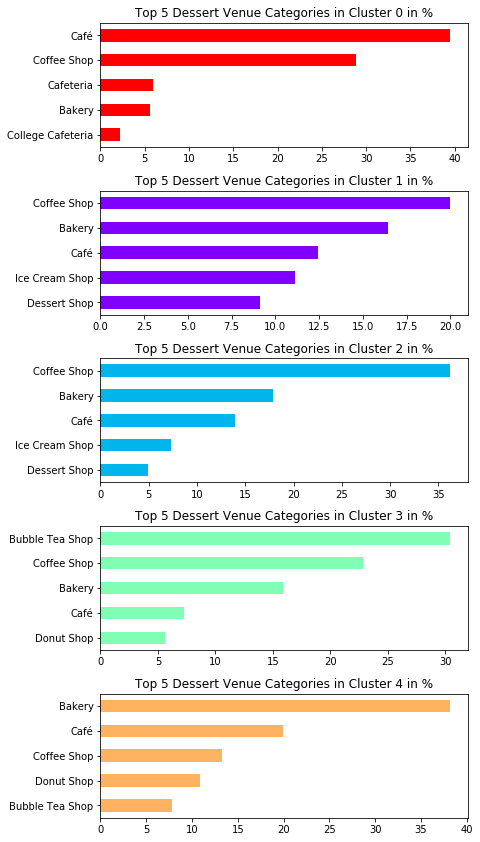

In [154]:
## using k from k-means, and filtering only top 5 categories of each cluster
k = 5  # change k here
top = 5 

fig, axes = plt.subplots(k,1, figsize=(6,12))

for cluster in range(k):
    plt.subplot(k, 1, cluster + 1)
    data = cat_in_clusters[cluster].sort_values(ascending=False)[0:top]
    data.plot(kind='barh', color=rainbow[cluster-1])
    plt.gca().invert_yaxis()
    plt.title('Top 5 Dessert Venue Categories in Cluster ' + str(cluster) + ' in %')

plt.subplots_adjust(top=1, bottom=0.08, left=0.10, right=0.95, hspace=0.35,
                    wspace=0.35)
plt.show()

__Adding to the clustering analysis__  
0. Red - Around Stanford University near Palo Alto, and businesses near the bay. This cluster has large proportion of coffee shop and cafe, which makes sense for busy office workers and students. The presence of cafeteria and college cafeteria also agrees well with our location analysis.
1. Purple - Mostly offices and industrial as well as residential neighborhoods. This cluster has a broad variety of dessert venues with coffee shop taking the top spot at only about 20%. This cluster is probably best explained as a mix bag of dessert venues as well as mixed use areas.
2. Blue - Residential and businesses scattered largely towards South San Jose. This cluster has the same top five as Cluster 1, but with stronger proportion of coffee shop. This could be due to the cluster having larger fraction of offices, particularly in Sunnyvale and Santa Clara area.
3. Green - Residential neighborhoods on the east San Jose side. Interestingly, bubble tea shop takes top spot in this cluster. While bubble tea is largely enjoyed by many, it is often associated with people of Asian-descent, as it is originated from Taiwan. It would be interesting to see the demograhic profile of this cluster.
4. Orange - Small neighborhoods. Bakery takes up 40% of dessert venues in this cluster of small neighborhoods scattered in the South Bay Area. It would also be interesting to see the demographic correlation with this group.

## Demographic Data

To understand possible reasons behind the clustering of these neighborhoods, we
__use decision tree to identify demographic features which correlate best with this clustering__.

Let's __import the csv version of the demographic data__ by zip code provided by the Santa Clara County at: https://data-sccphd.opendata.arcgis.com/datasets/demographic-statistics-zip-code

In [155]:
demo_all = pd.read_csv('Demographic_Statistics__Zip_Code.csv')
print(demo_all.shape)
demo_all.head()

(53, 24)


,OBJECTID,zip_code,totpop,popaf,popapi,poplat,popwht,popfgnborn,otherlang,hh_sp,hh_ch,hh_ave,age0_5,age6_11,age12_17,age18_24,age25_34,age35_44,age45_54,age55_64,age65plus,age0_17,Shape__Area,Shape__Length
0,1,95138,18889,3,47,17,29,39,53.0,6.0,53.0,3.35,10,11,9,6,12,19,17,10,6,30,0.006857,0.460883
1,2,95120,37457,1,30,7,59,31,38.0,4.0,42.0,3.01,6,10,11,6,5,14,20,14,15,27,0.010636,0.758227
2,3,95136,42989,5,28,28,35,32,45.0,10.0,38.0,2.79,9,8,7,8,18,16,13,10,10,24,0.001247,0.228163
3,4,95123,62228,4,19,30,43,27,42.0,9.0,38.0,2.96,8,8,8,9,15,16,15,10,10,25,0.002189,0.302803
4,5,94304,3627,2,28,5,62,33,37.0,NaN,20.0,1.82,8,5,3,5,20,17,9,7,27,16,0.001712,0.377544


### Data Cleaning
We are interested in the population __race/ethnicity age distribution, and household data__. So let's filter to only these columns. According to the data source, these numbers are __provided in percentage of population__, except for the household data.

There are 4 NaNs in Household with Single Parents which is 9% of our data. Dropping 4 zip codes would take away too much precious data, so we __drop the single parent column__ instead.

In [156]:
demo = pd.DataFrame()
demo = demo_all.drop(columns=['OBJECTID', 'totpop', 'hh_sp', 'age0_5', 'age6_11', 'age12_17',
                              'Shape__Area', 'Shape__Length'])

# Renaming columns
demo.rename(columns={'zip_code':'Zip', 
                     'popaf':'African-American',
                     'popapi':'Asian-Pacific Islander',
                     'poplat':'Latino',
                     'popwht':'White',
                     'popfgnborn':'Foreign Born',
                     'otherlang':'Other Language',
                     'hh_ch':'Household with Children',
                     'hh_ave':'Average Household Size',
                     'age18_24':'Age 18-24',
                     'age25_34':'Age 25-34',
                     'age35_44':'Age 35-44',
                     'age45_54':'Age 45-54',
                     'age55_64':'Age 55-64',
                     'age65plus':'Age 65 Plus',
                     'age0_17':'Age 0-17'
                    }, inplace=True)

demo['Zip'] = demo['Zip'].astype('str') # zips should be string as we're not doing math
print(demo.shape)
demo.head()

(53, 16)


,Zip,African-American,Asian-Pacific Islander,Latino,White,Foreign Born,Other Language,Household with Children,Average Household Size,Age 18-24,Age 25-34,Age 35-44,Age 45-54,Age 55-64,Age 65 Plus,Age 0-17
0,95138,3,47,17,29,39,53.0,53.0,3.35,6,12,19,17,10,6,30
1,95120,1,30,7,59,31,38.0,42.0,3.01,6,5,14,20,14,15,27
2,95136,5,28,28,35,32,45.0,38.0,2.79,8,18,16,13,10,10,24
3,95123,4,19,30,43,27,42.0,38.0,2.96,9,15,16,15,10,10,25
4,94304,2,28,5,62,33,37.0,20.0,1.82,5,20,17,9,7,27,16


__Merge with cluster labels__ by mapping zip codes. Use inner join so that the zip code with no venues is dropped.

In [157]:
zip_demo_labeled = pd.merge(zip_merged[['Zip','Cluster Labels']], demo,  \
                           how='inner', left_on='Zip', right_on='Zip')
print(zip_demo_labeled.shape)
zip_demo_labeled.head()

(44, 17)


,Zip,Cluster Labels,African-American,Asian-Pacific Islander,Latino,White,Foreign Born,Other Language,Household with Children,Average Household Size,Age 18-24,Age 25-34,Age 35-44,Age 45-54,Age 55-64,Age 65 Plus,Age 0-17
0,94089,0,2,40,22,33,40,51.0,30.0,2.71,7,20,14,14,12,13,19
1,95134,0,4,51,14,27,54,61.0,28.0,2.41,6,36,18,10,7,4,18
2,95070,2,0,41,4,52,38,44.0,38.0,2.84,5,4,11,21,14,20,24
3,94305,0,5,28,10,50,26,37.0,18.0,2.19,57,23,3,3,3,5,7
4,95123,1,4,19,30,43,27,42.0,38.0,2.96,9,15,16,15,10,10,25


Let's check if there's any missing values.

In [158]:
zip_demo_labeled[zip_demo_labeled.isna().any(axis=1)]

,Zip,Cluster Labels,African-American,Asian-Pacific Islander,Latino,White,Foreign Born,Other Language,Household with Children,Average Household Size,Age 18-24,Age 25-34,Age 35-44,Age 45-54,Age 55-64,Age 65 Plus,Age 0-17
16,95113,1,15,33,13,37,44,NaN,NaN,1.79,9,29,15,9,6,27,5


Okay only one row. we can drop it. Let's also see data ranges.

In [205]:
zip_demo_labeled.dropna(inplace=True)
print(zip_demo_labeled.shape)
zip_demo_labeled.describe()

(43, 17)


,Cluster Labels,African-American,Asian-Pacific Islander,Latino,White,Foreign Born,Other Language,Household with Children,Average Household Size,Age 18-24,Age 25-34,Age 35-44,Age 45-54,Age 55-64,Age 65 Plus,Age 0-17
count,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.00000,43.00000,43.000000,43.000000,43.000000
mean,1.651163,2.627907,33.069767,24.046512,37.000000,38.069767,50.930233,37.186047,2.885349,9.279070,16.558140,15.55814,14.27907,10.093023,11.395349,22.744186
std,1.088549,1.272853,17.151142,16.953653,19.655364,10.733560,16.296940,8.553072,0.556055,8.009891,6.272777,2.59397,3.04979,2.234086,4.583301,3.934542
min,0.000000,0.000000,10.000000,3.000000,4.000000,19.000000,22.000000,18.000000,1.820000,4.000000,4.000000,3.00000,3.00000,3.000000,4.000000,7.000000
25%,1.000000,2.000000,21.000000,11.500000,21.500000,30.000000,39.500000,31.000000,2.530000,6.500000,13.000000,15.00000,13.00000,9.000000,9.000000,21.000000
50%,2.000000,3.000000,28.000000,21.000000,36.000000,38.000000,51.000000,38.000000,2.790000,8.000000,16.000000,16.00000,14.00000,10.000000,10.000000,24.000000
75%,2.000000,3.000000,42.500000,31.500000,51.000000,47.000000,63.500000,43.000000,2.955000,9.500000,19.500000,17.00000,16.00000,11.500000,12.000000,25.000000
max,4.000000,5.000000,71.000000,65.000000,75.000000,56.000000,84.000000,57.000000,4.450000,57.000000,36.000000,20.00000,21.00000,15.000000,27.000000,29.000000


### Decision Tree

We have 43 zip codes with their corresponding cluster labels, and 15 features. Now let's do some segmentation to see how demographic data might correlate with dessert shop clustering.

While some may argue that it is necessary to scale the data using packages like StandardScaler, in this case our __data has already been normalized to the total population within each zip code__ (i.e. row-wise). Hence, each value is between 0 (or 1) and 100. In other words, there is only 2 orders of magnitude between the smallest and biggest data point, and that is reasonable for most mathematical iterations approaches.

In [161]:
from sklearn.tree import DecisionTreeClassifier
#from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# form a list of features from the demographic dataframe
features = zip_demo_labeled.iloc[:,2:].columns.tolist()
X = zip_demo_labeled[features].values
#X = StandardScaler().fit(X).transform(X.astype(float))  ## we're not going to scale data

y = zip_demo_labeled['Cluster Labels'].astype('str').values  # string needed for viz later
#y = StandardScaler().fit(y).transform(y.astype(float))  ## we're not going to scale data


We will also need a visualization function `plot_tree` to see the tree.

In [162]:
from sklearn import tree
import pydotplus
from IPython.display import Image

def plot_tree(decision_tree_object, features, y):
    # Create DOT data
    dot_data = tree.export_graphviz(decision_tree_object, out_file=None, 
                                    feature_names=features,  # feature names from pd column names
                                    class_names=np.unique(y))   # np to find label names

    # Draw graph
    graph = pydotplus.graph_from_dot_data(dot_data)  

    # Show graph
    return Image(graph.create_png()) 

__Choosing model parameters__: with 5 clusters, `max_depth` needs to be at least 3. This is because depth 2 will only give max of 2^2 = 4 groups. On the other end, we have 15 features and going beyond 15 depths means some features will definitely be repeatedly used in the tree. This does not mean a feature cannot be repeated, but it is definite that the model is trying to overfit with depth > 15.

Train sample size:  36
Test sample size:  7
DecisionTrees's Accuracy:  0.5714285714285714


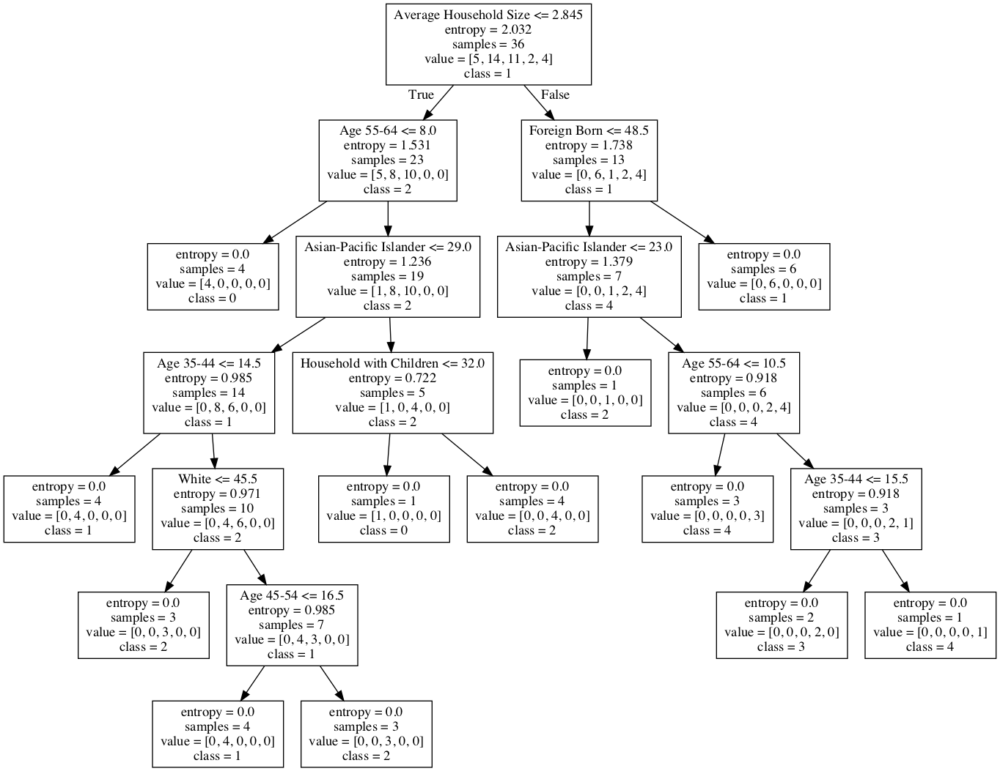

In [169]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=4)
print('Train sample size: ', len(y_train))
print('Test sample size: ', len(y_test))

dt = DecisionTreeClassifier(criterion='entropy', max_depth=15)
dt.fit(X_train,y_train)
y_pred = dt.predict(X_test)
print("DecisionTrees's Accuracy: ", accuracy_score(y_test, y_pred))

# call the viz function to generate tree plot
plot_tree(dt, features, y)

With `max_depth` set to 15, the model only fits to depth 6 even with multiple attempts. Therefore in our tuning, we should only explore max_depth between 4 and 6. Also noted is that the multiple attempts give accuracy score between 0.2 and 0.666. This variation is a sign that our data is rather small for what we are trying to do.

To tune our parameter, we use __grid search with cross validation__ of 3 folds. Initially, 7 fold was set in order to achieve test set size similar to our attempt above (`test_set=0.15`). However, it gave a warning that the number of sample per cluster needs to be >= number of splits. This makes sense for when we had test_set=0.15, yielding 7 samples in the test set for 5 clusters, which is too few. By reducing the `cv` value gradually, we found 3 to be accepted by the method.

In [208]:
from sklearn.model_selection import ParameterGrid, GridSearchCV

dt = DecisionTreeClassifier(criterion='entropy')

# note: GridSearchCV takes dict or list of dict for parameter grid
param_grid = [{'max_depth':[3, 4, 5, 6]}]
dt_search = GridSearchCV(dt, param_grid, cv=3)
dt_search.fit(X, y)

scores = dt_search.cv_results_['mean_test_score']
params = dt_search.cv_results_['params']

for param, score, in zip(params, scores):
    print(f"{param}: {score:.3f}")
    
print("Best param: ", dt_search.best_params_)

{'max_depth': 3}: 0.326
{'max_depth': 4}: 0.395
{'max_depth': 5}: 0.442
{'max_depth': 6}: 0.395
Best param:  {'max_depth': 5}


/Users/boriopas/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Results from a few attempts shows that the best max_depth changes between 5 and 6, with 5 being the most frequent. Note however, that the mean_test_score hovers around 0.35 to 0.57, which is not very high. We shall generate the __decision tree with test_size=0.33 and max_depth=5__, but the model must be used with caution.

Test sample size:  15
DecisionTrees's Accuracy:  0.4666666666666667


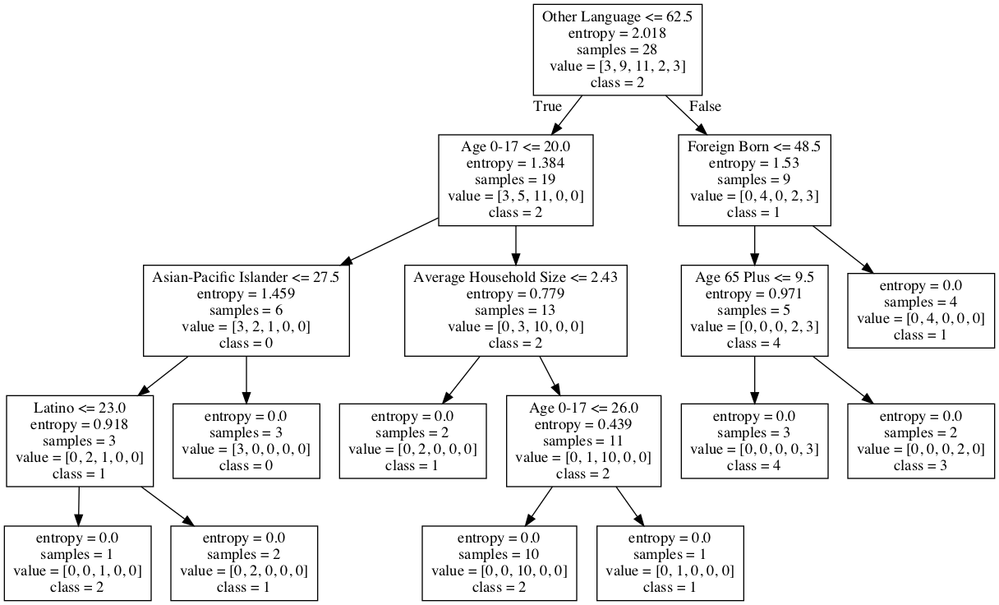

In [170]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=3)
print('Test sample size: ', len(y_test))

dt = DecisionTreeClassifier(criterion='entropy', max_depth=5)
dt.fit(X_train,y_train)
y_pred = dt.predict(X_test)
print("DecisionTrees's Accuracy: ", accuracy_score(y_test, y_pred))

# call the viz function to generate tree plot
plot_tree(dt, features, y)

Despite setting max_depth=5, the model often return with __high accuracy score when there is actually depth of 4__, like shown above. Therefore it is likely that 5th and 6th depths do not add benefit (i.e. reducing entropy) to the model usually.

## Discussion and Conclusion

- Cluster 0 (Red) – “Offices and College” – large Other Language, small Age 0-17, small Asian-Pacific Islander population. i.e. English-speaking adults. This description ties well with the cluster being a primarily a college and office area with coffee shops, cafes and cafeteria.
- Cluster 1 (Purple)  – “Mixed Use” – there are 4 paths to get to this label, and there is no clear logic. This cluster is still best described as “mixed” even from demographic perspective.
- Cluster 2 (Blue) – “Offices and Residential” – two ways. Both require smaller Other Language, smaller Age 0-17. However, one requires Average Household Size >2.43, other requires smaller Asian-Pacific Islander and Latino. The common demographic features fit well with the office and residential description of these neighborhoods, given that businesses often use English as a primary language.
- Cluster 3 (Green) –  “Residential” – larger Other Language, but smaller Foreign-Born population, larger population of age > 65. Perhaps, there is a community, young and old, of many generations of immigrants in this cluster of neighborhoods, where people really enjoy bubble tea. Interestingly, percentage of Asian-Pacific Islander population is not a feature, opposite to what was initially hypothesized.
- Cluster 4 (Orange) – “Bakery Towns” – Almost similar to Cluster 3, except with smaller population of age 65 plus. 

## Backup Calculations

In [172]:
zips.sort_values('Zip')

,Zip,City,Latitude,Longitude
36,94022,Los Altos,37.377140,-122.124120
31,94024,Los Altos,37.353741,-122.087170
43,94040,Mountain View,37.380207,-122.087870
37,94041,Mountain View,37.389490,-122.078460
23,94043,Mountain View,37.406790,-122.074610
41,94085,Sunnyvale,37.388940,-122.017956
14,94086,Sunnyvale,37.378341,-122.023980
30,94087,Sunnyvale,37.350091,-122.036020
0,94089,Sunnyvale,37.406289,-122.008380
34,94301,Palo Alto,37.443688,-122.150710


In [176]:
demo_all.sort_values('zip_code')

,OBJECTID,zip_code,totpop,popaf,popapi,poplat,popwht,popfgnborn,otherlang,hh_sp,hh_ch,hh_ave,age0_5,age6_11,age12_17,age18_24,age25_34,age35_44,age45_54,age55_64,age65plus,age0_17,Shape__Area,Shape__Length
28,29,94022,18500,1,24,3,69,27,28.0,2.0,35.0,2.63,6,9,9,4,5,12,18,15,22,24,0.004603,0.529129
33,34,94024,22385,0,25,4,66,25,28.0,4.0,39.0,2.83,7,10,10,4,4,13,19,14,19,27,0.001923,0.360679
41,42,94040,32996,2,28,21,46,37,46.0,5.0,33.0,2.41,8,7,6,8,19,17,14,10,11,21,0.000972,0.285122
50,51,94041,13292,2,22,25,47,32,38.0,7.0,24.0,2.23,8,5,4,7,24,18,14,10,9,18,0.000403,0.128520
10,11,94043,28358,3,27,21,45,38,45.0,5.0,26.0,2.35,9,6,5,7,22,18,14,10,10,19,0.002814,0.319902
5,6,94085,21247,2,35,37,24,47,64.0,9.0,38.0,2.95,10,6,6,9,26,16,12,8,6,22,0.000920,0.170395
31,32,94086,45697,2,42,21,31,47,57.0,6.0,34.0,2.52,10,6,5,7,25,17,13,9,9,21,0.001182,0.223845
47,48,94087,54293,1,43,9,43,44,52.0,4.0,41.0,2.71,9,9,7,5,12,18,15,10,14,25,0.001734,0.263709
22,23,94089,19245,2,40,22,33,40,51.0,4.0,30.0,2.71,8,5,5,7,20,14,14,12,13,19,0.001583,0.187041
48,49,94301,16995,2,16,5,73,25,28.0,5.0,29.0,2.30,6,7,7,5,13,14,16,13,19,21,0.000624,0.144260


In [178]:
shops[['Zip','id']].groupby('Zip').count()

,id
Zip,
94022,23
94024,8
94040,30
94041,23
94043,49
94085,35
94086,19
94087,35
94089,30


In [179]:
zip_cat_labeled.sort_values('Zip')

,Zip,Cluster Labels,American Restaurant,Bagel Shop,Bakery,Bar,Bowling Alley,Breakfast Spot,Bubble Tea Shop,Burger Joint,Burrito Place,Business Service,Cafeteria,Café,Candy Store,Chinese Restaurant,Chocolate Shop,Coffee Shop,College Cafeteria,Convenience Store,Corporate Cafeteria,Corporate Coffee Shop,Creperie,Cupcake Shop,Dairy Store,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Donut Shop,Emergency Room,Empanada Restaurant,Fast Food Restaurant,Food Court,Food Stand,Food Truck,French Restaurant,Frozen Yogurt Shop,German Restaurant,Greek Restaurant,Grocery Store,Ice Cream Shop,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Juice Bar,Mediterranean Restaurant,Mexican Restaurant,North Indian Restaurant,Office,Other Nightlife,Pastry Shop,Peruvian Restaurant,Pizza Place,Pop-Up Shop,Portuguese Restaurant,Restaurant,Sandwich Place,Shopping Mall,Snack Place,Sporting Goods Shop,Taco Place,Taiwanese Restaurant,Tea Room,Vietnamese Restaurant
35,94022,1,0.000000,0.043478,0.173913,0.000000,0.000000,0.086957,0.086957,0.000000,0.000000,0.00000,0.000000,0.173913,0.043478,0.00,0.000000,0.173913,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.043478,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.043478,0.000000,0.000000,0.086957,0.000000,0.00000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.043478,0.000000
30,94024,1,0.125000,0.125000,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00,0.000000,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.125,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
42,94040,1,0.000000,0.100000,0.100000,0.000000,0.000000,0.000000,0.066667,0.000000,0.000000,0.00000,0.000000,0.233333,0.000000,0.00,0.000000,0.200000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.033333,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.033333,0.133333,0.000000,0.00000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
36,94041,1,0.000000,0.000000,0.217391,0.000000,0.000000,0.000000,0.086957,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00,0.000000,0.304348,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.130435,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.130435,0.000000,0.00000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.043478,0.086957
22,94043,2,0.020408,0.040816,0.102041,0.000000,0.000000,0.020408,0.000000,0.000000,0.000000,0.00000,0.000000,0.142857,0.000000,0.00,0.000000,0.448980,0.000000,0.000000,0.000000,0.081633,0.000000,0.000000,0.000,0.020408,0.020408,0.000000,0.020408,0.020408,0.000000,0.000000,0.000000,0.00,0.000000,0.020408,0.000000,0.000000,0.000000,0.000000,0.000000,0.040816,0.000000,0.00000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
40,94085,4,0.000000,0.028571,0.342857,0.000000,0.000000,0.000000,0.085714,0.000000,0.000000,0.00000,0.000000,0.285714,0.000000,0.00,0.000000,0.085714,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.057143,0.000000,0.000000,0.114286,0.000000,0.00000

In [200]:
cat[cat['Count'] >1].shape

(34, 2)

In [212]:
zip_demo_labeled.groupby('Cluster Labels').count()

,Zip,African-American,Asian-Pacific Islander,Latino,White,Foreign Born,Other Language,Household with Children,Average Household Size,Age 18-24,Age 25-34,Age 35-44,Age 45-54,Age 55-64,Age 65 Plus,Age 0-17
Cluster Labels,,,,,,,,,,,,,,,,
0,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
1,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16
2,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15
3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
